# napari-imagegrains Statistical analysis: properties

This widget allows you to post-process the segmentation results to compute statistical information about imagegrains.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import napari
from napari_imagegrains.imgr_proc_widget import ImageGrainProcWidget
from napari_imagegrains.imgr_demodata_widget import ImageGrainDemoWidget
from napari_imagegrains.imgr_stats_widget import ImageGrainStatsWidget
from pathlib import Path
import os
import shutil

---

## Data Preparation

In [3]:
demodata_folder = Path.home().joinpath("imagegrains/")
if demodata_folder.exists() and demodata_folder.is_dir():
    shutil.rmtree(demodata_folder)

In [4]:
viewer = napari.Viewer()
demo_widget = ImageGrainDemoWidget(viewer=viewer)
demo_widget._on_click_download_demodata()

self = demo_widget.widget

"""
viewer = napari.Viewer()
self = ImageGrainProcWidget(viewer=viewer)
viewer.window.add_dock_widget(self);
"""

'\nviewer = napari.Viewer()\nself = ImageGrainProcWidget(viewer=viewer)\nviewer.window.add_dock_widget(self);\n'

In [5]:
exports_folder = Path.home().joinpath("imagegrains/exports/")
if not exports_folder.exists():
    os.makedirs(exports_folder, exist_ok=True)

In [6]:
self.pred_directory.set_value(exports_folder)

In [7]:
self.image_folder = Path.home().joinpath("imagegrains/demo_data/FH/train/")

In [8]:
self.viewer.layers.clear()

In [9]:
self.image_list.update_from_path(self.image_folder)
self.image_list.setCurrentRow(0)

In [10]:
self.check_save_mask.setChecked(True)
self._on_click_segment_image_folder()

In [11]:
viewer.close()

---

## Explore statistical analysis

Segmented images can be analyzed statistically. For this purpose, you need to select an image folder and a folder with the corresponding prediction masks. The `Prediction selection` section provides you with the possibility to enter a prediction string that is used as filter for the files in the predictions folder. 

In order to explore statistical analysis, click on the image list to select an image. Both the image and the corresponding prediction mask are displayed in the viewer. Now click on `Run on image`. The result is plotted in the `Analysis` section of the view.

In addition, the viewer generates a table with the complete statistical data for the image. It has one column for each parameter that is computed: `label`, `area`, `orientation`, `ell: b-axis (px)`, `ell: a-axis (px)`, `centerpoint y`, `centerpoint x`, `local centerpoint y`, and `local centerpoint x`. By clicking on the `floppy disk` symbol, you can save the plot of the selected parameter to the location you like. 

In [12]:
viewer = napari.Viewer()
self = ImageGrainStatsWidget(viewer=viewer)
viewer.window.add_dock_widget(self);

In [13]:
self.image_folder = Path.home().joinpath("imagegrains/demo_data/FH/train/")
self.image_list.update_from_path(self.image_folder)
self.mask_folder = Path.home().joinpath("imagegrains/exports")
self.mask_list.update_from_path(self.mask_folder)
self.image_list.setCurrentRow(4)

In [14]:
self._on_run_grainsize_on_image()

 : 148  grains found


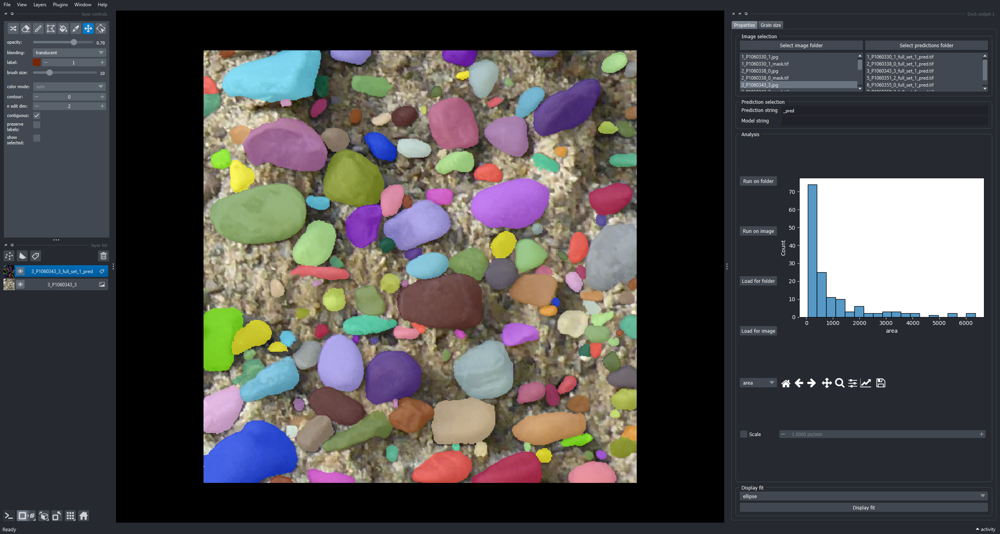

In [15]:
napari.utils.NotebookScreenshot(viewer)

You can explore the plots of the various parameters now. Change the analysis parameter, for example from `area` to `ell: a-axis (px)`. You will see the corresponding plot.

In [16]:
self.combobox_prop_to_plot.set_value("ell: a-axis (px)")

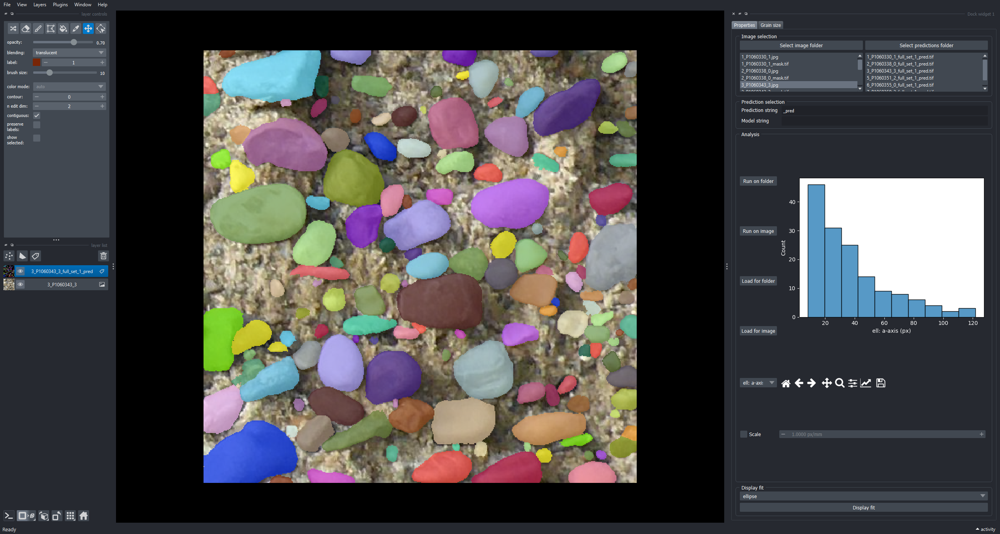

In [17]:
napari.utils.NotebookScreenshot(viewer)

If you need to change the scale (default is 1 pixel/millimeter), activate the `Scale` checkbox and change the scale, for example to 10 pixel/ millimeter. Click `Run on image` and select `ell: a-axis (mm)` in the dropdown menu of the `Analysis` section. You see the adapted plot with the chosen millimeter scale. Be aware that the table generated earlier is updated. It now contains two more columns, `ell: a-axis(mm)` and `ell: b-axis (mm)` with the rescaled values.

In [18]:
self.check_scale.setChecked(True)
self.spinbox_scale.setValue(10)

In [19]:
self._on_run_grainsize_on_image()

 : 148  grains found


In [20]:
self.combobox_prop_to_plot.set_value("ell: a-axis (mm)")

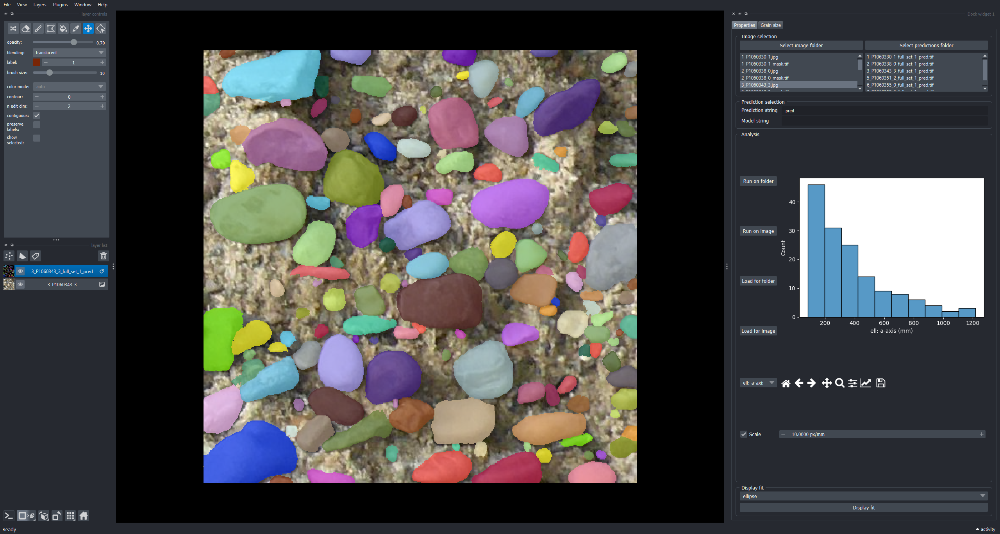

In [21]:
napari.utils.NotebookScreenshot(viewer)

---

## Fitting ellipses and contours

You can fit ellipses to the objects displayed in the images by clicking `Display fit` having the (default) `ellipse` option selected. You will see the fitted ellipses and the small and large ellipse axes.

In [22]:
self._on_display_fit()

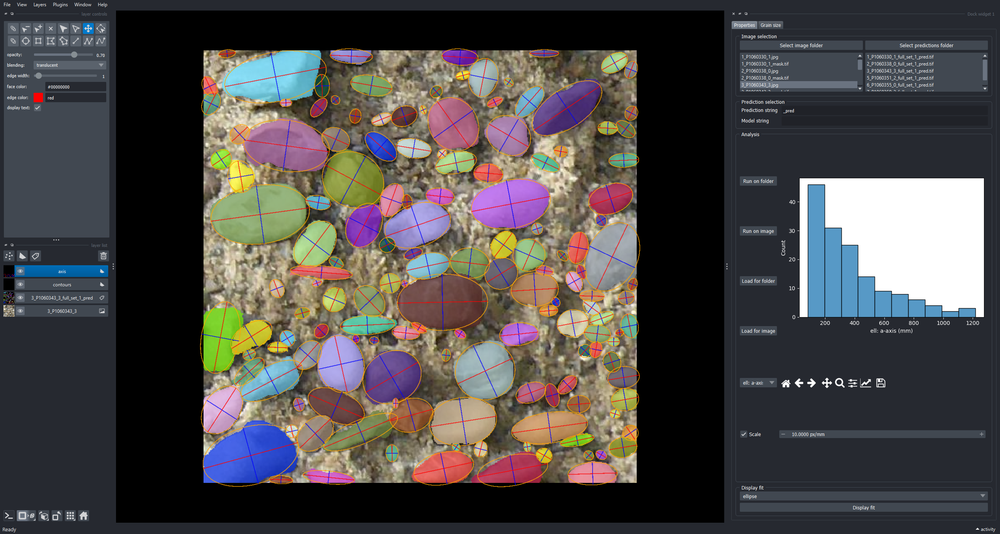

In [23]:
napari.utils.NotebookScreenshot(viewer)

Alternatively, you can select the display fit option `mask_outline` in order to see the contours of the objects together with the large and small axes.

In [24]:
self.dropdown_fit_method.set_value('mask_outline')

In [25]:
self._on_display_fit()

None Number of grains with irregular/small shape: 5


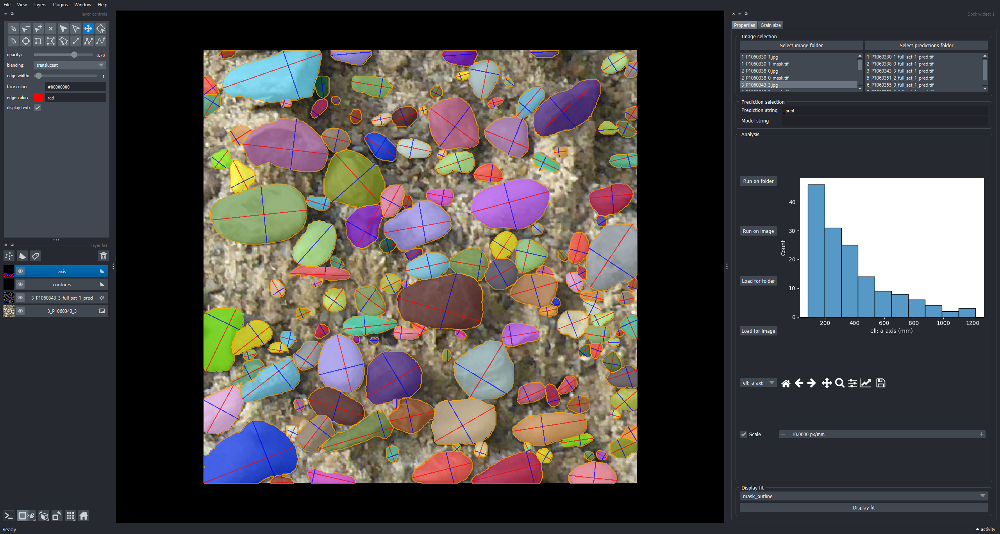

In [26]:
napari.utils.NotebookScreenshot(viewer)

---

## Continue exploration with another image

You can continue your exploration by selecting another image from the image list. The GUI is refreshed. Click `Run on image`. You obtain updated data: the new plot for the parameter and the scale selected and a new data table with the computation results of all parameters.

In [27]:
self.image_list.setCurrentRow(0)
self._on_run_grainsize_on_image()

 : 55  grains found


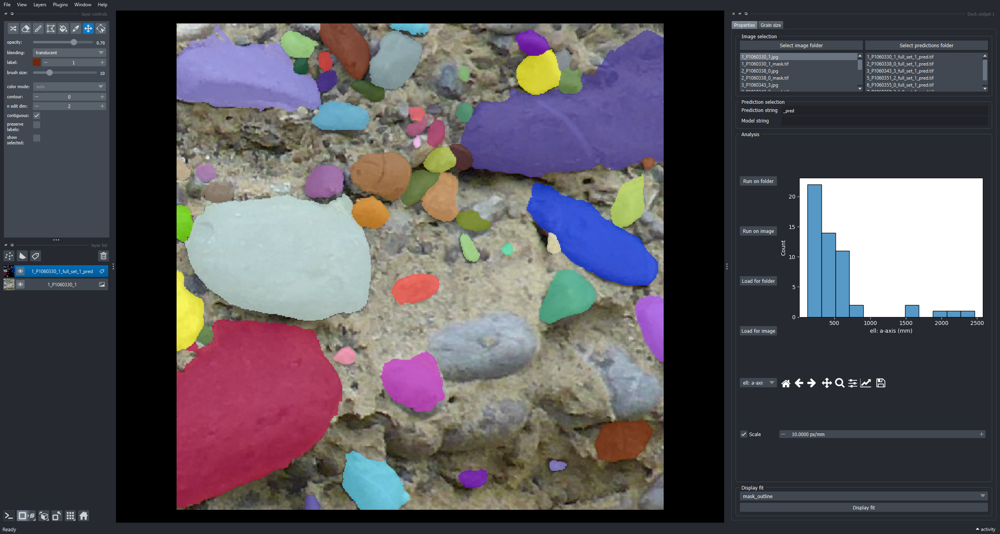

In [28]:
napari.utils.NotebookScreenshot(viewer)

---

## Interactive table

The table generated when you click on `Run on image` is interactive. In the napari viewer, on the left side, activate the checkbox `show selected`. If you click on any sample in the table now, you will see the corresponding object highlighted in the viewer.

---

## Analyze entire folder

Open a new viewer instance, select an image folder and a folder containing the prediction masks an click `Run on folder`. You obtain a plot of the selected (default) parameter displayed in the viewer. For each image in the folder you obtain a `csv file` with the entire table information instead of individual tables. These `csv files` are stored in your export folder and named in accordance with the prediction masks.

In [29]:
viewer.close()

In [30]:
viewer = napari.Viewer()
self = ImageGrainStatsWidget(viewer=viewer)
viewer.window.add_dock_widget(self);
self.image_folder = Path.home().joinpath("imagegrains/demo_data/FH/train/")
self.image_list.update_from_path(self.image_folder)
self.mask_folder = Path.home().joinpath("imagegrains/exports")
self.mask_list.update_from_path(self.mask_folder)

In [31]:
self._on_run_grainsize_on_folder()

C:\Users\micha\imagegrains\exports:  67%|██████████████████████████████▋               | 4/6 [00:00<00:00, 29.37file/s]

1_P1060330_1_full_set_1_pred : 55  grains found
2_P1060338_0_full_set_1_pred : 31  grains found
3_P1060343_3_full_set_1_pred : 148  grains found
5_P1060351_2_full_set_1_pred : 100  grains found
6_P1060355_0_full_set_1_pred : 85  grains found
7_P1060359_3_full_set_1_pred : 104  grains found


C:\Users\micha\imagegrains\exports: 100%|██████████████████████████████████████████████| 6/6 [00:00<00:00, 28.66file/s]


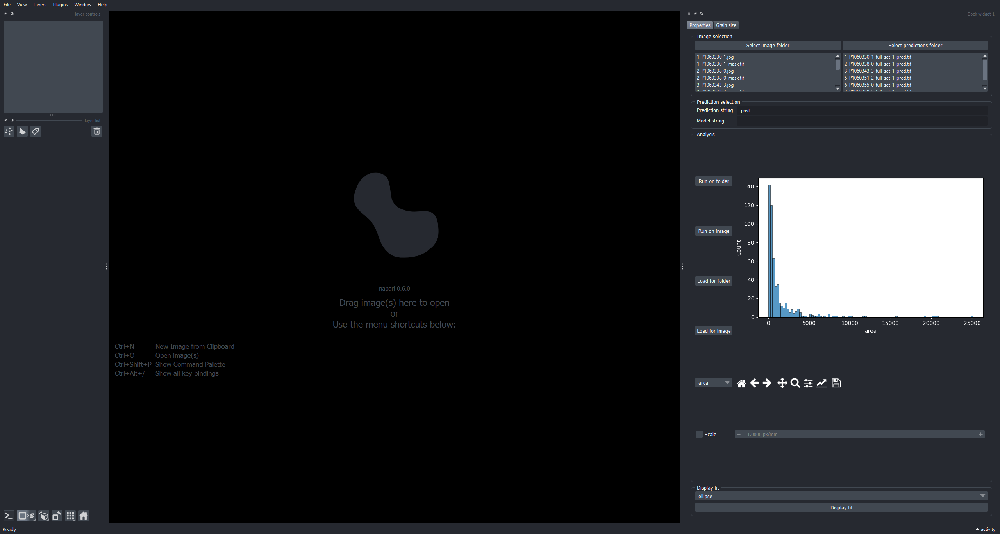

In [32]:
napari.utils.NotebookScreenshot(viewer)

Here as well, you can browse through the plots of the parameters you are interested in (e.g. `orientation`). Be aware that the plots represent the sum of the objects in all images in the folder now.

In [33]:
self.combobox_prop_to_plot.set_value("orientation")

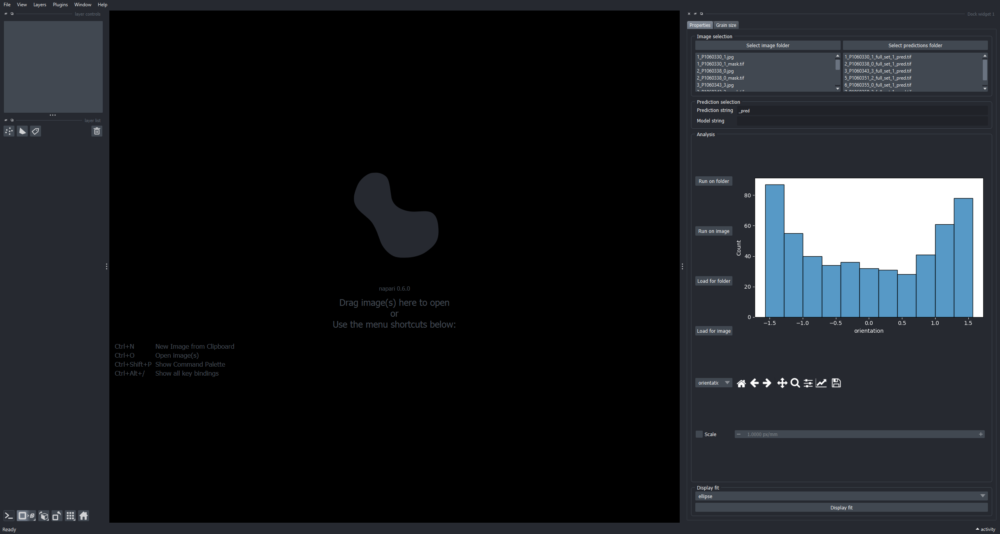

In [34]:
napari.utils.NotebookScreenshot(viewer)

With `Load for folder` you can reload the data generated in this section in case that you have to restart the application.